In [1]:
import numpy as np 
import pandas as pd 
import os
import zipfile
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch.transforms import ToTensor
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader
import cv2
import torch
from torch import nn
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.model_selection import train_test_split
import torchvision.models as models
import torch.optim as optim

from torchvision.utils import make_grid
from torchvision import transforms as T

In [2]:
train_zip = zipfile.ZipFile('../input/dogs-vs-cats-redux-kernels-edition/train.zip','r')
test_zip = zipfile.ZipFile('../input/dogs-vs-cats-redux-kernels-edition/test.zip','r')
train_zip.extractall('./')
test_zip.extractall('./')
train_zip.close()
test_zip.close()

In [3]:
train_images_paths = [os.path.join("/kaggle/working/train/", i) for i in os.listdir("/kaggle/working/train/") ]
test_images_paths = [os.path.join("/kaggle/working/test/", i) for i in os.listdir("/kaggle/working/test/") ]

In [4]:
train = pd.DataFrame(train_images_paths)
train.columns = ['path']

test = pd.DataFrame(test_images_paths)
test.columns = ['path']

In [5]:
test.head()

,path
0,/kaggle/working/test/12122.jpg
1,/kaggle/working/test/694.jpg
2,/kaggle/working/test/10890.jpg
3,/kaggle/working/test/7101.jpg
4,/kaggle/working/test/9881.jpg


In [6]:
train['label'] = train['path'].apply(lambda x: (x.find('cat') >=0)*1 )

In [7]:
train.head()

,path,label
0,/kaggle/working/train/dog.5933.jpg,0
1,/kaggle/working/train/dog.6677.jpg,0
2,/kaggle/working/train/cat.7264.jpg,1
3,/kaggle/working/train/dog.4088.jpg,0
4,/kaggle/working/train/cat.4152.jpg,1


In [8]:
train, val, _,_  = train_test_split(train, train, test_size=0.1)

In [9]:
train= train.reset_index(drop=True)
val= val.reset_index(drop=True)

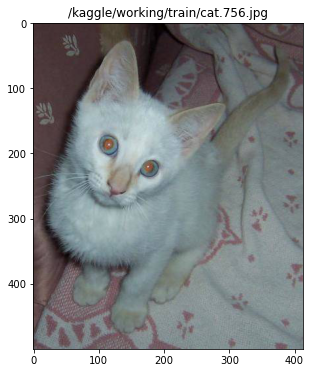

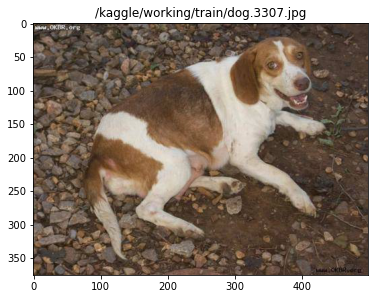

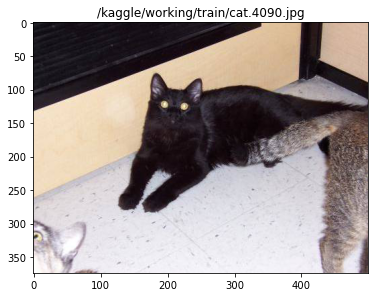

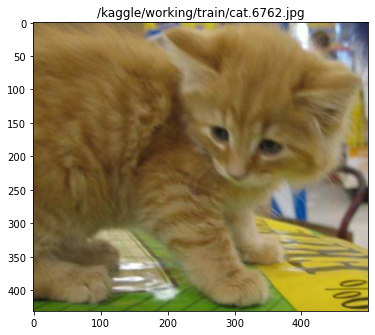

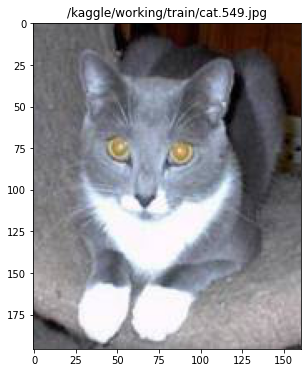

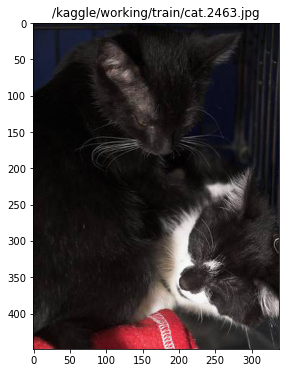

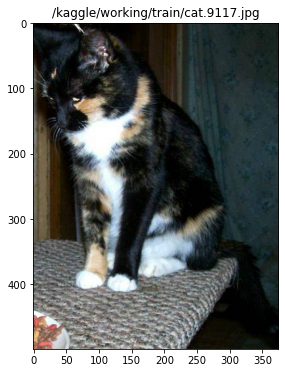

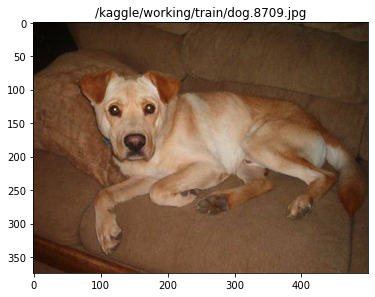

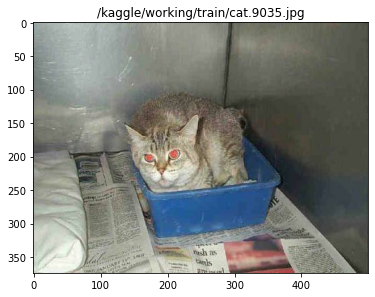

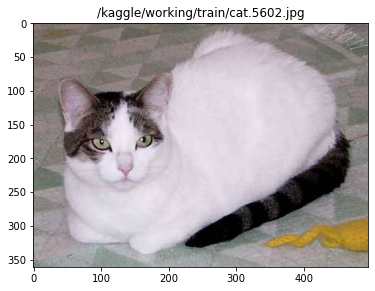

In [10]:
for i in range (10):
    plt.figure(figsize=(6,6))
    img = plt.imread(train.loc[i,'path'])
    plt.imshow(img)
    plt.title(train.loc[i,'path'])
    plt.show()

In [11]:
for i in range (10):
    img = plt.imread(train.loc[i,'path'])
    print(img.shape)

(500, 413, 3)
(375, 499, 3)
(374, 500, 3)
(431, 500, 3)
(196, 161, 3)
(449, 338, 3)
(499, 375, 3)
(374, 500, 3)
(374, 500, 3)
(361, 496, 3)


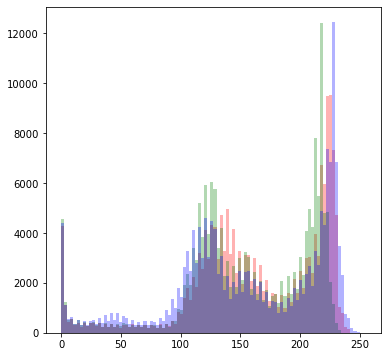

In [12]:
plt.figure(figsize=(6,6))
plt.hist(img[:,:,0].flatten(), bins = 100, label = 'r', color='r', alpha = 0.3)
plt.hist(img[:,:,1].flatten(), bins = 100, label = 'g', color='g', alpha = 0.3)
plt.hist(img[:,:,2].flatten(), bins = 100, label = 'b', color='b', alpha = 0.3)
plt.show()

In [13]:
def get_train_transform(size=224):
    return A.Compose([
        A.Resize(size, size),
        A.HorizontalFlip(p=0.5),
        A.ColorJitter (brightness=0.07, contrast=0.07,
                           saturation=0.1, hue=0.1, always_apply=False, p=0.3)
    ])

train_transform = get_train_transform()

test_transform = A.Compose([
    A.Resize(224,224)
])


to_tensor_transform = T.Compose([
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406],
                    [0.229, 0.224, 0.225]),
    ])


def get_inverse_transform(mean_ = [0.485, 0.456, 0.406], 
                          std_ = [0.229, 0.224, 0.225]):
    return T.Compose([T.Normalize(mean=[0., 0., 0.],
                                  std=[1. / std_[0], 1. / std_[1], 1. / std_[2]]),
                      T.Normalize(mean=[-mean_[0], -mean_[1], -mean_[2]],
                                  std=[1., 1., 1.]),
                      ])

inverse_transform = get_inverse_transform()

In [14]:
class TrainDataset(Dataset):
    def __init__(self, train, transform=None, is_test= False ):
        self.X = train['path']
        self.is_test = is_test
        self.transform = transform
        if not self.is_test:
            self.y = train['label']
    
    def __len__(self):
        return len(self.X) 
    
    def __getitem__(self, index):
        image = cv2.imread(self.X[index])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.transform:
                image = self.transform(image=image)['image'] #.astype(np.float32)
        
        if self.is_test:
             return   to_tensor_transform(image) #.permute(2, 0 ,1).float()
        else: 
            label = self.y[index]
            return  to_tensor_transform(image) , label  # .permute(2, 0 ,1).float() 
      
    # H , W , C
    # C , H, W
    

In [15]:
train_dataset = TrainDataset(train, train_transform)
val_dataset = TrainDataset(val, train_transform)

train_dataloader =   DataLoader(train_dataset, batch_size = 16, shuffle = True)
val_dataloader =   DataLoader(val_dataset, batch_size = 16, shuffle = False)


In [16]:
def _imshow(img):
    print(img.shape)
    img = inverse_transform(img) #    # unnormalize
    npimg = img.numpy()
    npimg = np.transpose(npimg, (1, 2, 0))
    plt.figure(figsize=(20,20))
    plt.imshow(npimg)
    plt.show()

In [17]:
dataiter = iter(train_dataloader)
images, labels = dataiter.next()

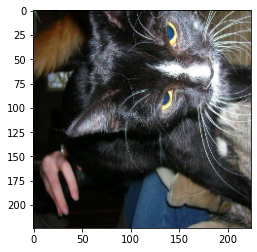

In [18]:
#look at single image
plt.imshow(inverse_transform(images[0]).permute(1,2,0).numpy())

torch.Size([3, 454, 1810])


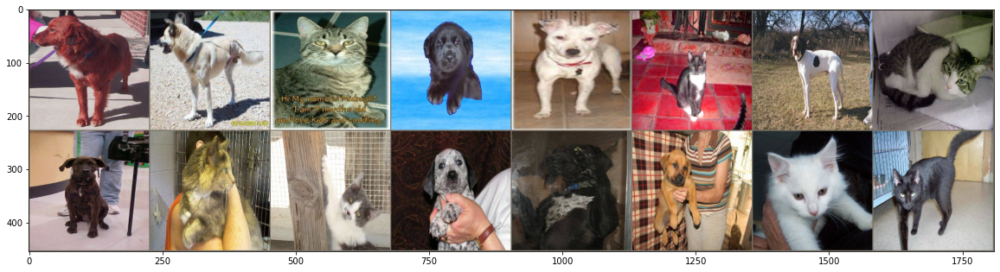

In [19]:
#make image grid for batch
dataiter = iter(train_dataloader)
images, labels = dataiter.next()
_imshow(make_grid(images))

In [20]:
test_dataset = TrainDataset(test, test_transform, is_test=True)
test_dataloader =  DataLoader(test_dataset, batch_size = 16, shuffle = False)

In [21]:
# # look at tensors shape
# for image_batch, label_batch in train_dataloader:
#     print(image_batch.shape, label_batch.shape )

In [22]:
resnet = models.resnet101(pretrained = True)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


  0%|          | 0.00/170M [00:00<?, ?B/s]

In [23]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [24]:
# transfer learning 
for param in resnet.parameters():
    param.requires_grad=False

![](https://www.topbots.com/wp-content/uploads/2020/05/cover_transfer_image_1600px_web.jpg)

In [25]:
class NN(nn.Module):
    def __init__(self, resnet_pretrained):
        super().__init__()
        self.resnet_pretrained = resnet_pretrained
        self.fc1 = nn.Linear(1000, 2)
        
    def forward(self, x):
        x = torch.relu(self.resnet_pretrained(x))
        x = self.fc1(x)
        return x

In [26]:
our_resnet_model = NN(resnet)

In [27]:
device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')

In [28]:
device

device(type='cuda', index=0)

In [29]:
our_resnet_model = our_resnet_model.to(device)

In [30]:
class Trainer:
    def __init__(self, model, device):
        self.model = model
        self.device = device
    
        self.loss = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam( [param for param in self.model.parameters() if param.requires_grad],
                                    lr=0.001)
        
    def fit(self, train_dataloader, val_dataloader, num_epochs):
        total = 0
        correct= 0
        
        loss_values = []
        accuracy_values = []
        
        for epoch in range(num_epochs):
            self.model.train()
            batch_number = 0
            loss_values_batch = []
            for x, y in train_dataloader:
                self.optimizer.zero_grad()
                x = x.to(self.device)
                y = y.to(self.device)
                outputs = self.model(x)
                l = self.loss(outputs, y)  
                l.backward()
                self.optimizer.step()
                
                _, predicted = torch.max(outputs, 1)
                total += y.size(0)
                correct += (predicted == y).sum().item()
                loss_value = l.item()
                loss_values.append(loss_value)
                accuracy_values.append(correct/total)

               
                if batch_number%100 ==0:
                    print(f"batch number {batch_number}, loss_value: {loss_value}")
                    current_accuracy = correct/total
                    print(f"current_accuracy: {current_accuracy}")
#                     plt.figure(figsize=(5,5))
#                     plt.plot(loss_values_batch)
#                     plt.show()
                    
                batch_number+= 1
                
            epoch_accuracy = correct/total
            print(f"epoch_accuracy: {epoch_accuracy}")
            print(f"end of epoch {epoch}")
            #make validation 
            
            epoch_val_loss = []
            
            correct = 0
            total = 0
            self.model.eval()
            with torch.no_grad():
                for x, y in val_dataloader:
                    x = x.to(self.device)
                    y = y.to(self.device)
                    outputs = self.model(x)
                    l = self.loss(outputs, y)
                    loss_value = l.item()
                    epoch_val_loss.append(loss_value)
                    _, predicted = torch.max(outputs, 1)
                    total += y.size(0)
                    correct += (predicted == y).sum().item()
                    
            print(f"Total {total} Correct {correct} Accuracy {correct/total}")
        
#         plt.figure(figsize=(5,5))
#         plt.plot(loss_values_batch)
#         plt.show()

    def predict(self, test_dataloader):
        self.model.eval()
        predictions = torch.tensor([]) 
        with torch.no_grad():
            for x  in test_dataloader:
                x = x.to(self.device)
                outputs = torch.nn.functional.softmax(self.model(x))
                predictions = torch.cat([predictions,outputs.detach().cpu()])
        return predictions.numpy()
                
               
                


In [31]:
trainer = Trainer( model= our_resnet_model, device= device)

In [32]:
trainer.fit(train_dataloader, val_dataloader, num_epochs=2) 

batch number 0, loss_value: 0.7979666590690613
current_accuracy: 0.625
batch number 100, loss_value: 0.28969162702560425
current_accuracy: 0.9461633663366337
batch number 200, loss_value: 0.21500107645988464
current_accuracy: 0.9477611940298507
batch number 300, loss_value: 0.03428679704666138
current_accuracy: 0.9532807308970099
batch number 400, loss_value: 0.01116619911044836
current_accuracy: 0.9562032418952618
batch number 500, loss_value: 0.10437610745429993
current_accuracy: 0.9580838323353293
batch number 600, loss_value: 0.01947612129151821
current_accuracy: 0.9582986688851913
batch number 700, loss_value: 0.012097496539354324
current_accuracy: 0.9592546362339515
batch number 800, loss_value: 0.14299418032169342
current_accuracy: 0.9605181023720349
batch number 900, loss_value: 0.020342575386166573
current_accuracy: 0.9613623751387348
batch number 1000, loss_value: 0.01164889894425869
current_accuracy: 0.9624125874125874
batch number 1100, loss_value: 0.05875092372298241
curre

In [33]:
test_predictions= trainer.predict(test_dataloader)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:82: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


In [34]:
test_predictions[0]

array([9.999771e-01, 2.286787e-05], dtype=float32)

In [35]:
test_predictions

array([[9.99977112e-01, 2.28678691e-05],
       [9.00411785e-01, 9.95881781e-02],
       [1.18426724e-04, 9.99881506e-01],
       ...,
       [3.64674300e-08, 1.00000000e+00],
       [9.99958038e-01, 4.19889111e-05],
       [9.93111849e-01, 6.88818935e-03]], dtype=float32)

In [36]:
test['label']= test_predictions[:,1]

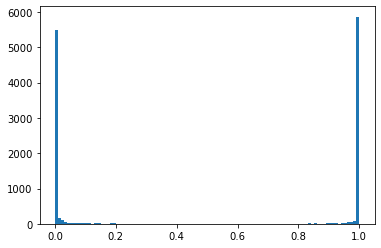

In [37]:
plt.hist(test['label'], bins = 100)
plt.show()

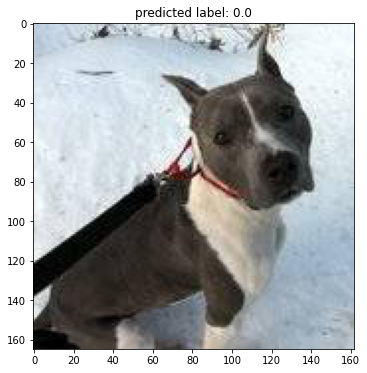

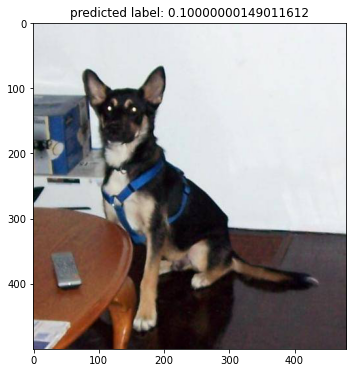

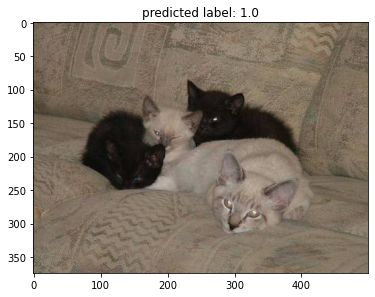

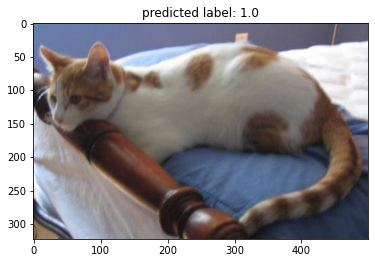

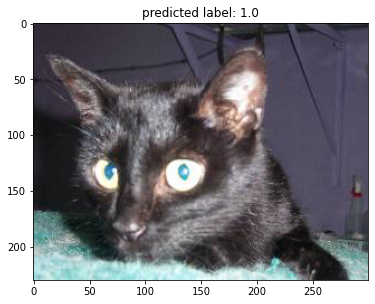

...

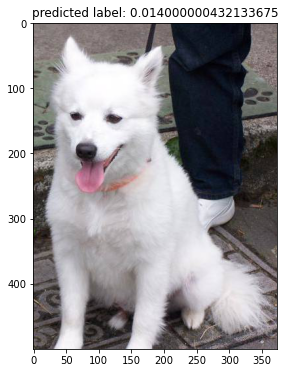

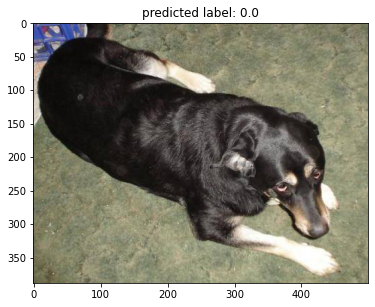

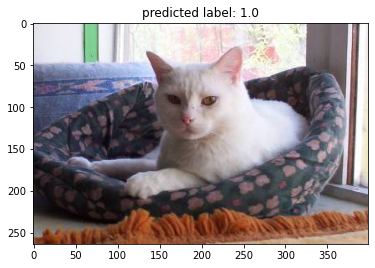

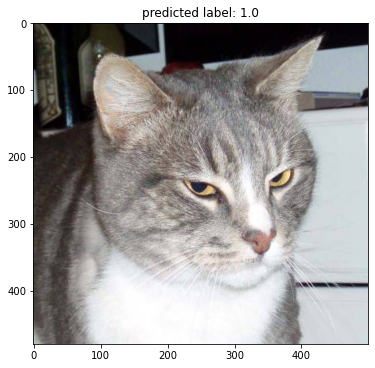

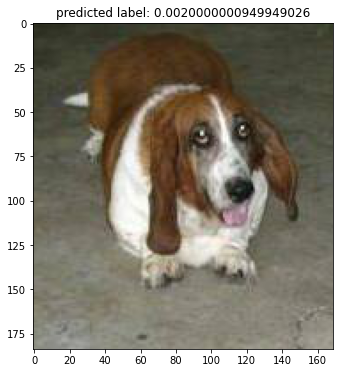

In [38]:
for i in range(0, 40):
    plt.figure(figsize=(6,6))
    img = plt.imread(test.loc[i,'path'])
    plt.imshow(img)
    plt.title(f"predicted label: {round(test.loc[i,'label'],3)}")
    plt.show()